In [28]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import os
from PIL import Image
import torch
import torch.nn as nn
from torch.optim import SGD, Adam
import torchvision
import torchvision.transforms as transforms
from torchvision import datasets
from torch.utils.data import Dataset
from torchsummary import summary
import torch.optim as optim

In [29]:
torch.manual_seed(42)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [30]:
# model = torch.hub.load('mateuszbuda/brain-segmentation-pytorch', 'unet',
#     in_channels=3, out_channels=1, init_features=32, pretrained=True)
# input_image = Image.open("data/train/MildDemented/mildDem0.jpg")
BATCH_SIZE = 32

data_transforms = transforms.Compose([
    # transforms.Resize((224,224)),
    transforms.Resize((256,256)),
    transforms.CenterCrop(224),
    transforms.RandomHorizontalFlip(0.4),
    transforms.RandomAffine(180,translate=(0.3,0.3), shear=10),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
    ]) 

# data_transforms = transforms.Compose([
#     transforms.Resize((224, 224)),
#     transforms.ToTensor(),
#     transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
#     ])  

data_dir = 'data'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                        data_transforms)
                    for x in ['train', 'test']}

dataloaders = {
    'train': torch.utils.data.DataLoader(image_datasets['train'], batch_size=BATCH_SIZE,
                                            shuffle=True, num_workers=4),
    'test': torch.utils.data.DataLoader(image_datasets['test'], batch_size=BATCH_SIZE,
                                            shuffle=True, num_workers=4)
                                            }

dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'test']}
class_names = image_datasets['train'].classes

In [31]:
print(class_names)

['MildDemented', 'ModerateDemented', 'NonDemented', 'VeryMildDemented']


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


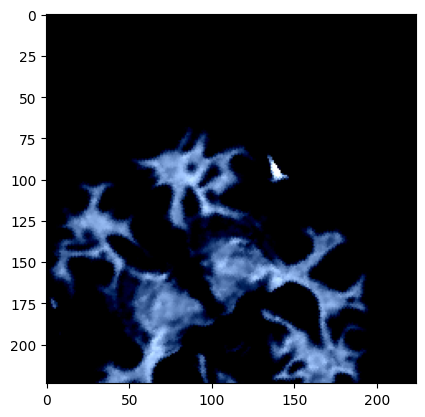

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 224, 224])


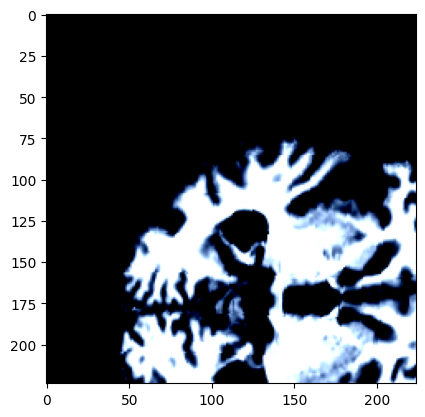

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 224, 224])


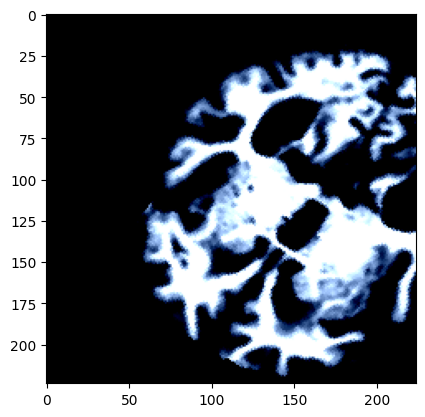

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 224, 224])


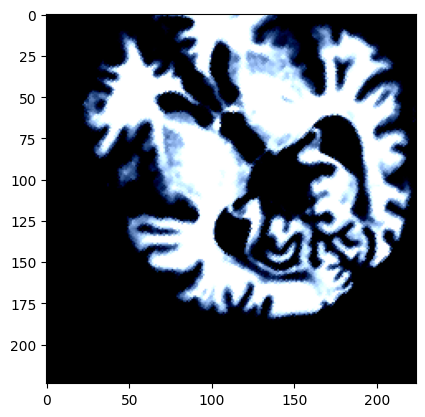

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 224, 224])


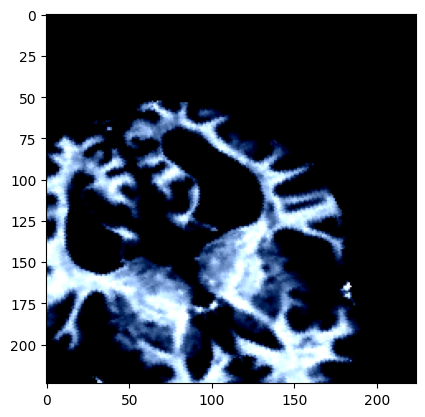

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 224, 224])


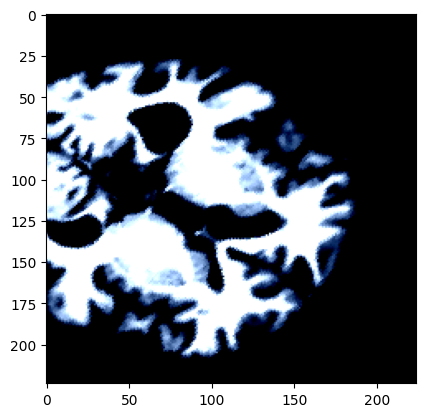

torch.Size([3, 224, 224])


In [33]:
sample_idxs = [0,1,2,3,4,5] # DO NOT MODIFY

# TODO

def imshow(img):
    npimg = img.numpy()
    plt.imshow(img.permute(1, 2, 0))
    plt.show()
    
for i in sample_idxs:
  img, lbl = image_datasets['train'][i]
  imshow(img)
  print(img.shape)

In [ ]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.figure(figsize=(64,64))
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])

In [61]:
# densenet = torch.hub.load('pytorch/vision:v0.10.0', 'densenet121', pretrained=True)
densenet = torchvision.models.densenet121(pretrained=True)    
num_ftrs = densenet.classifier.in_features
print(num_ftrs)
# model.classifier = nn.Linear(num_ftrs, 340)
# model.features.conv0.apply(squeeze_weights)

# num_ftrs = densenet.fc.in_features

1024


/home/valicia/miniconda3/envs/ml/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
/home/valicia/miniconda3/envs/ml/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [62]:
for param in densenet.parameters():
    param.requires_grad = False
    
# densenet.classifier = nn.Sequential(
#     # nn.Linear(num_ftrs, 4)
#     nn.Dropout(0.5),
#     nn.Flatten(),
#     nn.BatchNorm1d(num_ftrs),
#     nn.Linear(num_ftrs,1024),
#     # nn.BatchNorm1d(2048),
#     # nn.ReLU(),
#     # nn.Dropout(0.5),
#     # nn.Linear(2048,1024),
#     nn.BatchNorm1d(1024),
#     nn.ReLU(),
#     nn.Dropout(0.5),
#     nn.Linear(1024, 4),
# )

densenet.classifier = nn.Sequential(
    # nn.Linear(num_ftrs, 4)
    nn.Dropout(0.5),
    nn.Flatten(),
    nn.BatchNorm1d(num_ftrs),
    nn.Linear(num_ftrs,64),
    nn.BatchNorm1d(64),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(64,32),
    nn.BatchNorm1d(32),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(32, 4),
)

In [63]:
dense = densenet.to(device)
summary(dense)

Layer (type:depth-idx)                   Param #
├─Sequential: 1-1                        --
|    └─Conv2d: 2-1                       (9,408)
|    └─BatchNorm2d: 2-2                  (128)
|    └─ReLU: 2-3                         --
|    └─MaxPool2d: 2-4                    --
|    └─_DenseBlock: 2-5                  --
|    |    └─_DenseLayer: 3-1             (45,440)
|    |    └─_DenseLayer: 3-2             (49,600)
|    |    └─_DenseLayer: 3-3             (53,760)
|    |    └─_DenseLayer: 3-4             (57,920)
|    |    └─_DenseLayer: 3-5             (62,080)
|    |    └─_DenseLayer: 3-6             (66,240)
|    └─_Transition: 2-6                  --
|    |    └─BatchNorm2d: 3-7             (512)
|    |    └─ReLU: 3-8                    --
|    |    └─Conv2d: 3-9                  (32,768)
|    |    └─AvgPool2d: 3-10              --
|    └─_DenseBlock: 2-7                  --
|    |    └─_DenseLayer: 3-11            (53,760)
|    |    └─_DenseLayer: 3-12            (57,920)
|    |

Layer (type:depth-idx)                   Param #
├─Sequential: 1-1                        --
|    └─Conv2d: 2-1                       (9,408)
|    └─BatchNorm2d: 2-2                  (128)
|    └─ReLU: 2-3                         --
|    └─MaxPool2d: 2-4                    --
|    └─_DenseBlock: 2-5                  --
|    |    └─_DenseLayer: 3-1             (45,440)
|    |    └─_DenseLayer: 3-2             (49,600)
|    |    └─_DenseLayer: 3-3             (53,760)
|    |    └─_DenseLayer: 3-4             (57,920)
|    |    └─_DenseLayer: 3-5             (62,080)
|    |    └─_DenseLayer: 3-6             (66,240)
|    └─_Transition: 2-6                  --
|    |    └─BatchNorm2d: 3-7             (512)
|    |    └─ReLU: 3-8                    --
|    |    └─Conv2d: 3-9                  (32,768)
|    |    └─AvgPool2d: 3-10              --
|    └─_DenseBlock: 2-7                  --
|    |    └─_DenseLayer: 3-11            (53,760)
|    |    └─_DenseLayer: 3-12            (57,920)
|    |

In [64]:

criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(dense.parameters(), lr=0.001) #lr - learning step
epoch = 65

acc_LIST_dense = []
loss_LIST_dense = []

# Train the CNN
for epoch in range(epoch):
  running_loss = 0.0
  correct = 0
  total = 0
  for inputs, labels in dataloaders['train']:
      labels = labels.type(torch.LongTensor) # Cast to Float
      inputs, labels = inputs.to(device), labels.to(device)

      outputs = dense(inputs) # Feed the network the train data
      optimizer.zero_grad() # We need to reset the optimizer tensor gradient every mini-batch
      loss = criterion(outputs, labels) # this is the average loss for one mini-batch of inputs
      loss.backward() # Do a back propagation
      optimizer.step() # Update the weight using the gradients from back propagation by learning step      
      running_loss += loss.item() #get the accumulated loss for each epoch
      predicted = torch.argmax(outputs.data, 1) # use max to get the prediction
      total += labels.size(0)
      correct += torch.sum(predicted == labels).item()        
      
  accuracy = 100 * correct / total # Calculate Trining Acc
  acc_LIST_dense.append(accuracy)
  loss_LIST_dense.append(running_loss / len(dataloaders['train']) ) # get the avg loss for each epoch
  

  # print statistics
  print("The loss for Epoch {} is: {}, Accuracy = {}".format(epoch, running_loss/len(dataloaders['train']), accuracy))

The loss for Epoch 0 is: 1.0054683800069442, Accuracy = 51.86487014255028
The loss for Epoch 1 is: 0.9364281515157, Accuracy = 54.87209529388791
The loss for Epoch 2 is: 0.9084949293492003, Accuracy = 55.96563171255614
The loss for Epoch 3 is: 0.8944577389622327, Accuracy = 56.90294864284319
The loss for Epoch 4 is: 0.8781493965143002, Accuracy = 56.74672915446202
The loss for Epoch 5 is: 0.8777939370191246, Accuracy = 56.94200351493849
The loss for Epoch 6 is: 0.8715148736138522, Accuracy = 56.61003710212849
The loss for Epoch 7 is: 0.8691819173208675, Accuracy = 57.566881468463194
The loss for Epoch 8 is: 0.8548514295068587, Accuracy = 58.28939660222613
The loss for Epoch 9 is: 0.871068925590989, Accuracy = 58.4456160906073
The loss for Epoch 10 is: 0.8621635429607415, Accuracy = 58.4456160906073
The loss for Epoch 11 is: 0.8531692877689504, Accuracy = 57.23491505565319
The loss for Epoch 12 is: 0.8667397606446876, Accuracy = 58.50419839875025
The loss for Epoch 13 is: 0.881574353816

In [ ]:

criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(dense.parameters(), lr=0.001) #lr - learning step
epoch = 5

acc_LIST_dense = []
loss_LIST_dense = []

# Train the CNN
for epoch in range(epoch):
  running_loss = 0.0
  correct = 0
  total = 0
  for inputs, labels in dataloaders['train']:
      labels = labels.type(torch.LongTensor) # Cast to Float
      inputs, labels = inputs.to(device), labels.to(device)

      outputs = dense(inputs) # Feed the network the train data
      optimizer.zero_grad() # We need to reset the optimizer tensor gradient every mini-batch
      loss = criterion(outputs, labels) # this is the average loss for one mini-batch of inputs
      loss.backward() # Do a back propagation
      optimizer.step() # Update the weight using the gradients from back propagation by learning step      
      running_loss += loss.item() #get the accumulated loss for each epoch
      predicted = torch.argmax(outputs.data, 1) # use max to get the prediction
      total += labels.size(0)
      correct += torch.sum(predicted == labels).item()        
      
  accuracy = 100 * correct / total # Calculate Trining Acc
  acc_LIST_dense.append(accuracy)
  loss_LIST_dense.append(running_loss / len(dataloaders['train']) ) # get the avg loss for each epoch
  

  # print statistics
  print("The loss for Epoch {} is: {}, Accuracy = {}".format(epoch, running_loss/len(dataloaders['train']), accuracy))

In [60]:
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix

y_pred = []
y_true = []

for images, labels in dataloaders['test']:
    labels = labels.type(torch.LongTensor) # Cast to Float
    images, labels = images.to(device), labels.to(device)

    outputs = dense(images)
    output = (torch.argmax(outputs.data, 1)).data.cpu().numpy() 
    y_pred.extend(output)
    labels = labels.data.cpu().numpy()
    y_true.extend(labels) 

confusion_matrix_df = pd.DataFrame(confusion_matrix(y_true, y_pred))
confusion_matrix_df 

,0,1,2,3
0,32,0,49,98
1,3,0,0,9
2,6,1,462,171
3,11,0,168,269


Text(0.5, 1.0, 'Training accuracy vs epochs for Transfer DenseNet')

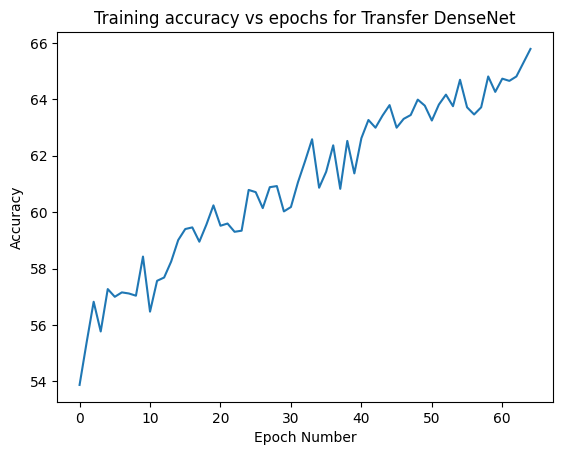

In [ ]:
import matplotlib.pyplot as plt

# print(acc_LIST_log)
plt.plot(np.arange(len(acc_LIST_dense)), acc_LIST_dense)
plt.xlabel('Epoch Number')
plt.ylabel('Accuracy')
plt.title('Training accuracy vs epochs for Transfer DenseNet')


Text(0.5, 1.0, 'Loss vs epochs for Transfer DenseNet')

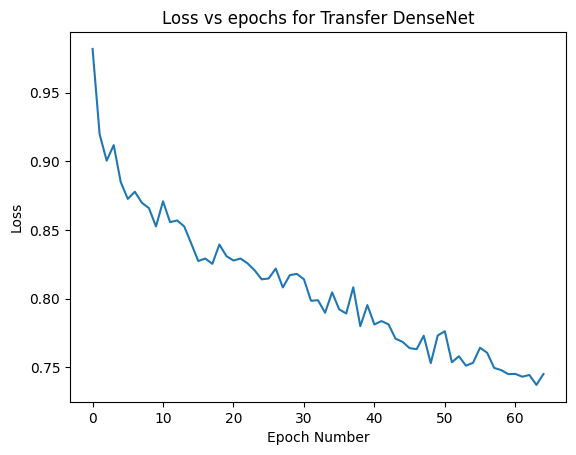

In [ ]:
plt.plot(np.arange(len(loss_LIST_dense)), loss_LIST_dense)
plt.xlabel('Epoch Number')
plt.ylabel('Loss')
plt.title('Loss vs epochs for Transfer DenseNet')

In [ ]:

total = 0
correct = 0
with torch.no_grad():
    for images, labels in dataloaders['test']:
        labels = labels.type(torch.LongTensor) # Cast to Float
        images, labels = images.to(device), labels.to(device)

        outputs = dense(images)
        predicted = torch.argmax(outputs.data, 1) # use max to get the prediction
        total += labels.size(0)
        correct += torch.sum(predicted == labels)


test_acc_dense = 100 * correct / total
print('Test Accuracy: ' + str(test_acc_dense))

Test Accuracy: tensor(61.5324, device='cuda:0')


In [ ]:
def train_batch(x, y, model, opt, loss_fn):
    model.train()
    opt.zero_grad()                    # Flush memory  
    batch_loss = loss_fn(model(x), y)  # Compute loss
    batch_loss.backward()              # Compute gradients
    opt.step()                         # Make a GD step
    
    return batch_loss.detach().cpu().numpy()

In [ ]:
@torch.no_grad()
def accuracy(x, y, model):
  """
  Calculate and return the accuracy. 
  x: features
  y: labels
  Return: accuracy
  """
  model.eval()
  prediction = model(x)
  argmaxes = prediction.argmax(dim=1) # get the predicted label 
  s = torch.sum((argmaxes == y).float())/len(y)  # calculate test accuracy
  return s.cpu().numpy()

In [ ]:
def plot(losses,accuracies,n_epochs):
  """
  Plot the training accuracies and losses over number of epochs 
  losses: a list of training loss
  accuracies: a list of training accuracy
  n_epochs: a list of number of epochs
  """
  plt.figure(figsize=(13,3))
  plt.subplot(121)
  plt.title('Training Loss value over epochs')
  plt.plot(np.arange(n_epochs) + 1, losses)
  plt.subplot(122)
  plt.title('Training Accuracy value over epochs')
  plt.plot(np.arange(n_epochs) + 1, accuracies)

In [ ]:
def train(trainset, testset, model, name):
  """
  Train the model with training dataset, and return the training losses, training
    accuracies, and number of epochs. 
  trainset: the processed train data with wanted dimensions
  testset:  the processed test data with wanted dimensions
  model: a torchvision model
  name: the name of the model in string
  Return: Testing accuracy, training losses, training accuracies, and number of epochs
  """
  device = 'cuda' if torch.cuda.is_available() else 'cpu'

  # load the data
  train_dl = torch.utils.data.DataLoader(trainset, batch_size=32,
                                          shuffle=True)
  test_dl = torch.utils.data.DataLoader(testset, batch_size=32,
                                         shuffle=False)

  # set up loss function and optimization function
  loss_func = nn.CrossEntropyLoss()
  opt = Adam(model.parameters(), lr=1e-3)

  # train and record the loss, accuracies for each training epoch
  losses, accuracies, n_epochs = [], [], 10
  for epoch in range(n_epochs):
      print(f"Running epoch {epoch + 1} of {n_epochs}")
      
      epoch_losses, epoch_accuracies = [], []
      for batch in train_dl:
          # calculate loss
          x, y = batch
          x, y = x.to(device), y.to(device)
          batch_loss = train_batch(x, y, model, opt, loss_func)
          epoch_losses.append(batch_loss)
      epoch_loss = np.mean(epoch_losses)

      for batch in train_dl:
          # calcualte accuracy 
          x, y = batch
          x, y = x.to(device), y.to(device)
          batch_acc = accuracy(x, y, model)
          epoch_accuracies.append(batch_acc)
      epoch_accuracy = np.mean(epoch_accuracies)

      losses.append(epoch_loss)
      accuracies.append(epoch_accuracy)

  # calculate the testing accuracy using the model we just trained
  epoch_accuracies = []
  for ix, batch in enumerate(iter(test_dl)):
      x, y = batch
      x, y = x.to(device), y.to(device)
      batch_acc = accuracy(x, y, model)
      epoch_accuracies.append(batch_acc)

  # save the model for future uses
  torch.save(model.state_dict(), name+".pth")
  print(f"Test accuracy: {np.mean(epoch_accuracies)}")
  return np.mean(epoch_accuracies), losses, accuracies, n_epochs

In [ ]:
def test_model(model, name):
  """
  Return the predicted labels for the 6 test images downloaded from Google. 
  model: a torchvision model
  name: the name of the model in string
  Return: the predicted labels for the 6 test images downloaded from Google
  """

  # apply the same transformation used in the training data
  transform = transforms.Compose(
    [transforms.ToTensor(),
      transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
      transforms.Resize((224,224))]) 
  
  # read and store 6 test images into a list
  files = os.listdir("test_images")
  images = []
  predicted_labels = []
  for file in files:
      image = Image.open("test_images/"+file)
      images.append(image)

  # for every image, get its predicted label
  for image in images:
      image = transform(image).cuda()
      image = image [None,:,:,:].float()
      model.load_state_dict(torch.load(name))
      model.eval()
      predictions = model(image)
      argmaxes = predictions.argmax(dim=1) 
      predicted_labels.append(argmaxes)
  
  return predicted_labels

In [ ]:
def main():
  device = 'cuda' if torch.cuda.is_available() else 'cpu'
  # transform the images to match the ImageNet image requirementa
  transform = transforms.Compose(
      [transforms.ToTensor(),
       transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
       transforms.Resize((224,224))]) 

  # save to data folder
  trainset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                          download=True, transform=transform)

  testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                        download=True, transform=transform)
  # a list of initialized models
  models = [densenet]
  # the names of the models
  names = ["dense"]
  # key: model name; value: a list of predicted labels
  images_predictions = {}

  test_acc = [] # store the testing accuracy
  for model, name in zip(models,names):
    acc, losses , accuracies, n_epochs = train(trainset,testset,model, name)
    test_acc.append(acc)
    plot(losses, accuracies, n_epochs)
    plt.show()
 
  # get the predicted labels for 6 test images for every model
  for model, name in zip(models,names):
    images_predictions[name] = test_model(model, name+".pth")
  
  # print the predicted labels for 6 test images for every model
  for key in images_predictions.keys():
    print(images_predictions[key])


In [ ]:
if __name__ == "__main__":
  main()

NameError: name 'main' is not defined

The link to the trained models and test images is: [Google Drive](https://drive.google.com/drive/folders/1-OUEcJdKhxSWR18ujDpnoLVIgpSGcWnB?usp=sharing)